# Teste do Modelo CNN com OCR

## Script Simplificado (Simulando o Fluxo OCR)

Como não podemos treinar um modelo Faster R-CNN aqui, pelos motivos já explicados no arquivo 12_Faster-CNN.ipynb, o script abaixo demonstra o **fluxo lógico e as etapas de processamento** que um sistema OCR baseado em **segmentação por contornos** usaria, substituindo a complexidade do Faster R-CNN por técnicas tradicionais de Visão Computacional (OpenCV) para segmentar os caracteres, e então, alimentá-los no modelo CNN (`char_recognition_cnn.keras`).

Este script utiliza as bibliotecas **OpenCV** para segmentação e **TensorFlow** para classificação.

⚠️ **Pré-requisitos:** ter as bibliotecas `cv2` (OpenCV), `tensorflow`, `numpy`, e os arquivos `char_recognition_cnn.keras` e `script_carregar_dados.py` (para o mapeamento de classes) no seu diretório.

    - pip install opencv-python
    - sudo apt install libgl1
    - sudo apt install libglib2.0-0

Found 51804 images belonging to 62 classes.
Found 7367 images belonging to 62 classes.
Found 7371 images belonging to 62 classes.
✅ Modelo e mapeamento de classes carregados com sucesso. Total de classes: 62

--- INÍCIO DO TESTADOR DE IMAGENS ---
Digite 'exit' para finalizar o programa.

Resultado Final (Ordenado): TESTEINIClALOCR


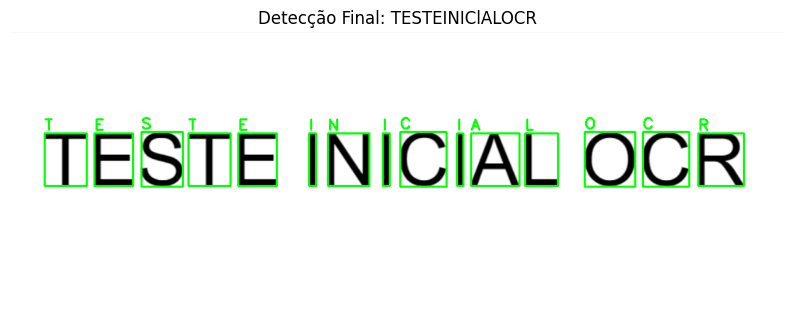


Resultado Final (Ordenado): Lq
InsiQCNNDIxHE
DIE
HHIAIIMINNI
NZI
JuIJE
SRQxNu
NFHE9F
uSIL
HWXASFIF
IAIFI
S
iHRWRQ
uuIN


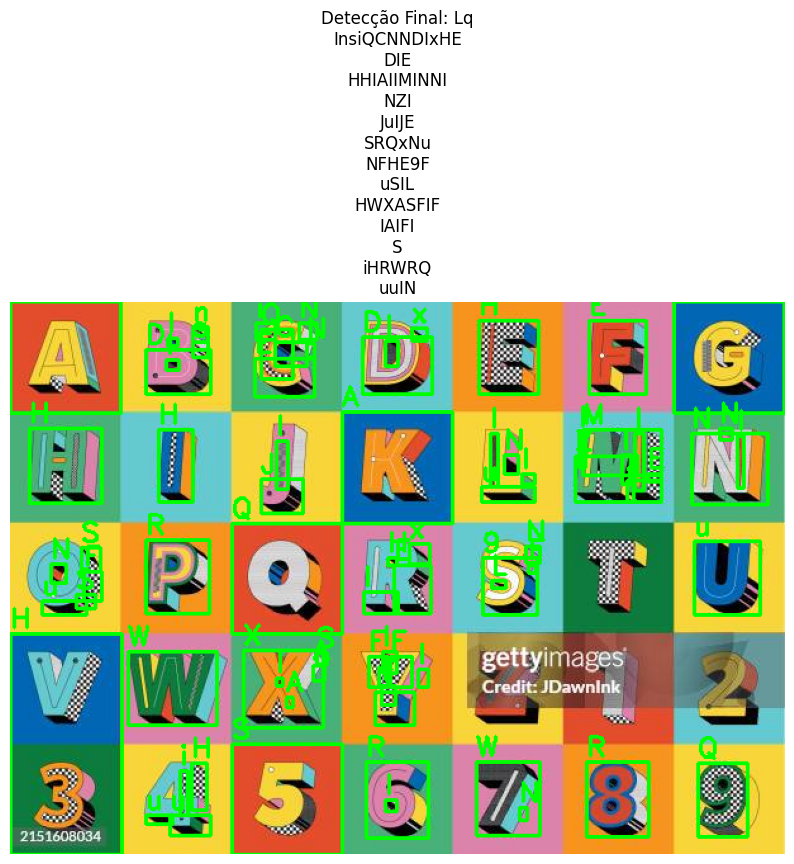


Resultado Final (Ordenado): N
vI
tMM
mmRk
m
ts
ABzxGOtSFHmRIKRZMGM
FIm
mnQfmpQqRtSfKUAQvMWKKgyzzI


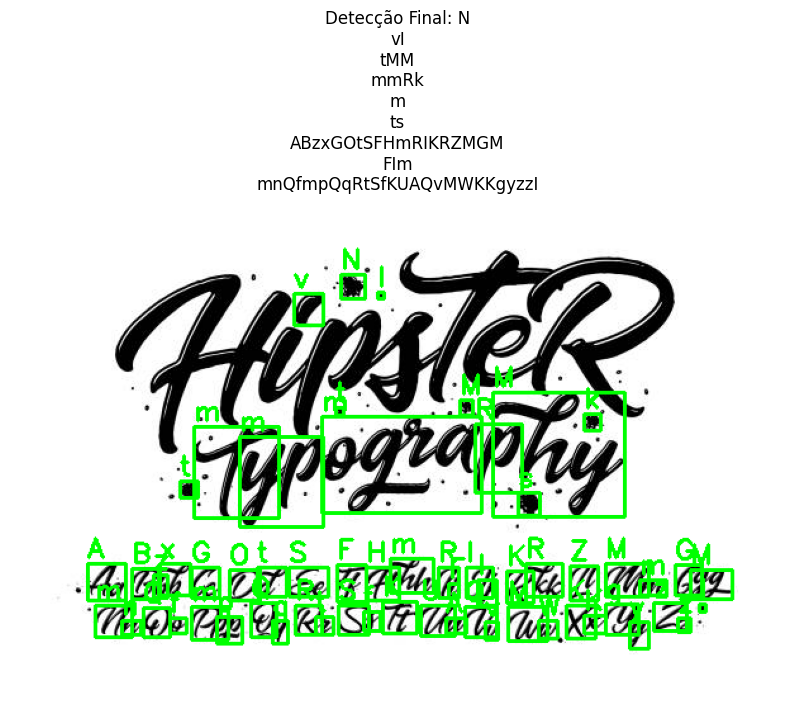


Resultado Final (Ordenado): A3cDEP
GHIJKbM
NoPQRsT
Uvwxyz


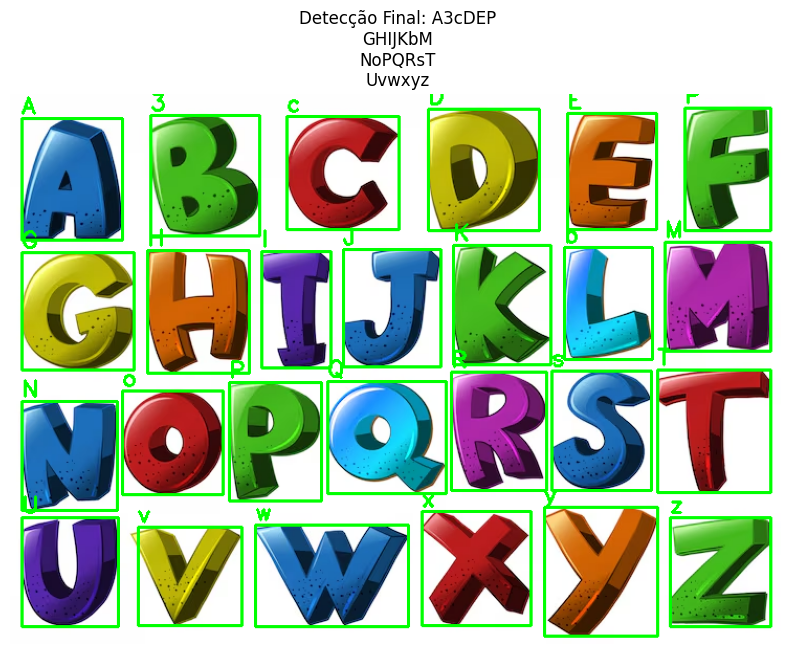


Resultado Final (Ordenado): V
I
I
I
I
iI
I
S
L
II
NII
in
L
NmI
m
iIiiiaiI
iIiImI
IIN
II
NII
Ii


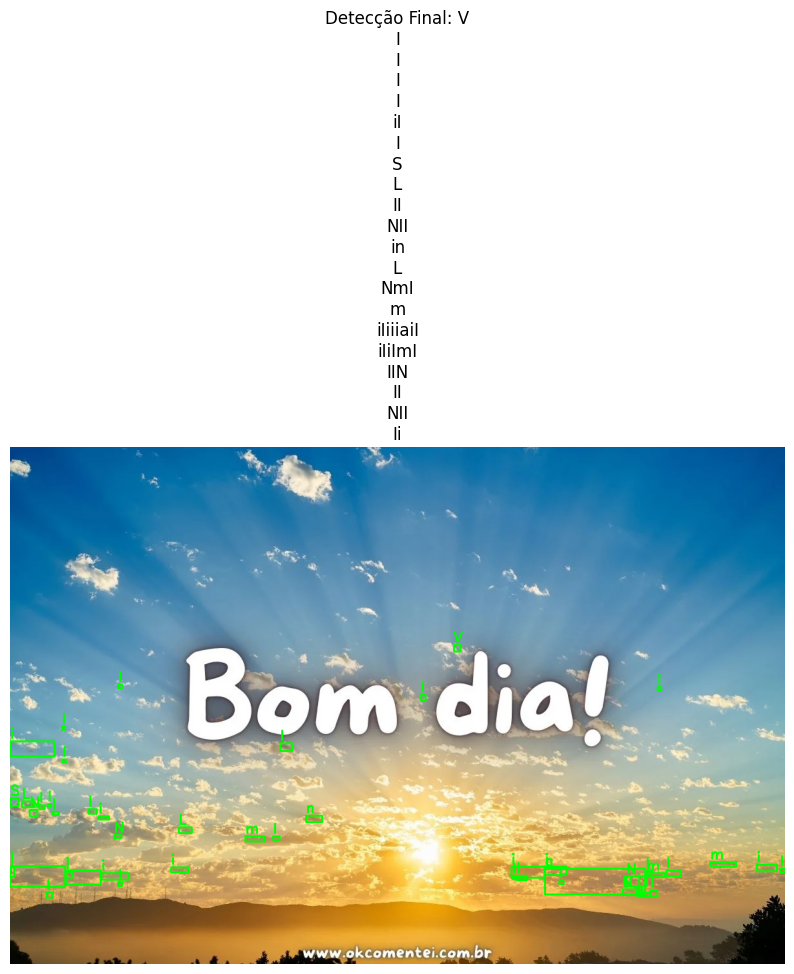


Resultado Final (Ordenado): Im
Ia
I
IOm
I
I


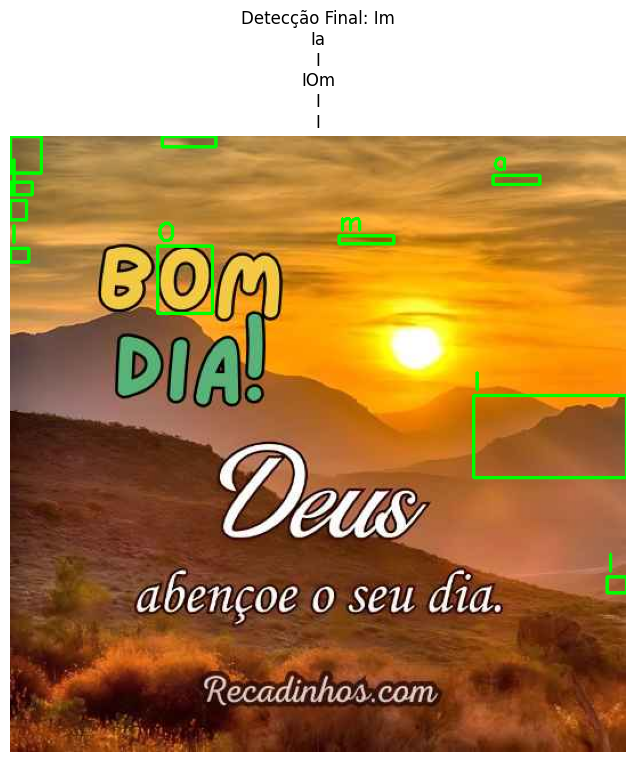


Resultado Final (Ordenado): BdOI
omla
I
oJd
JIIuLarIIIIruLurLrr
YUmUiLu
II
Ip
rrLIrLI
RI
d


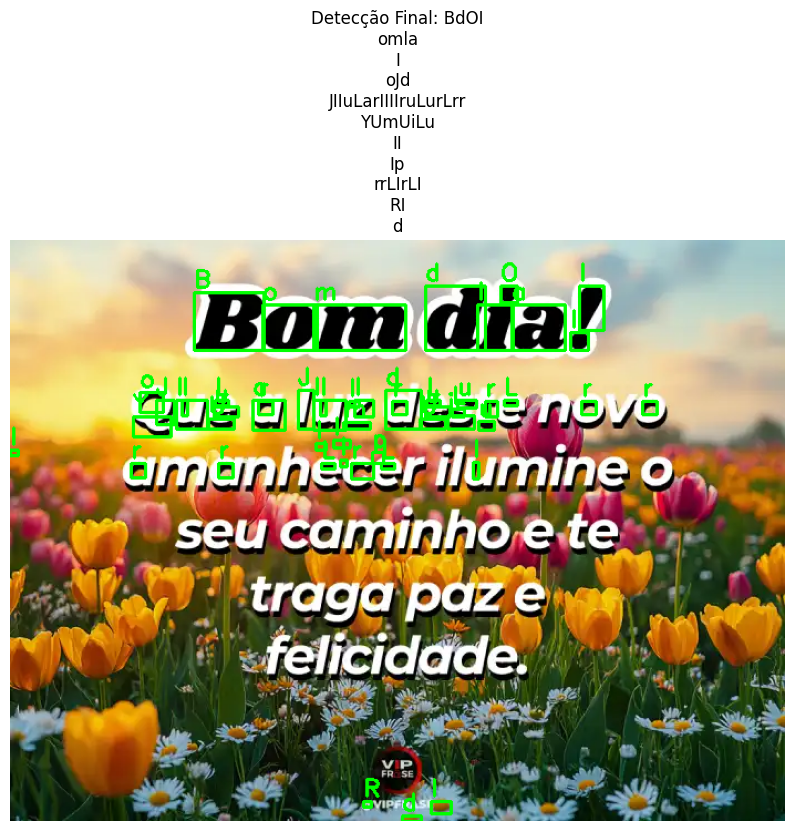


Resultado Final (Ordenado): BOM
DIA
I
F


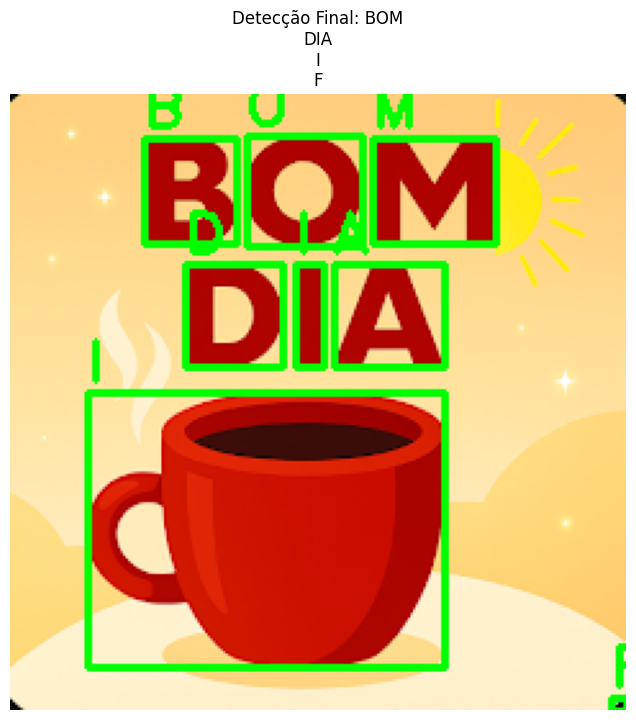


Resultado Final (Ordenado): BdO
Omla
y
tdNI
meuuaO
O


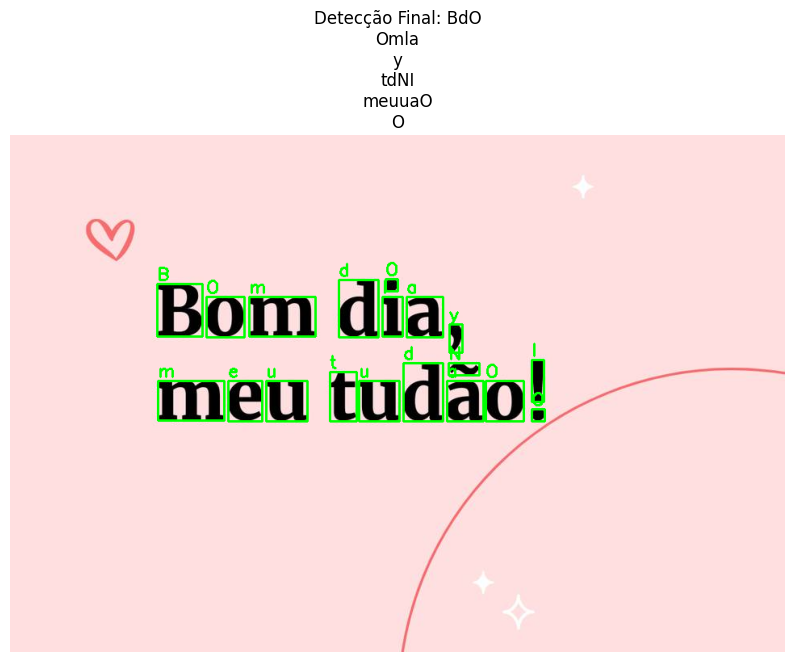


Resultado Final (Ordenado): O
B0MDIAI
I


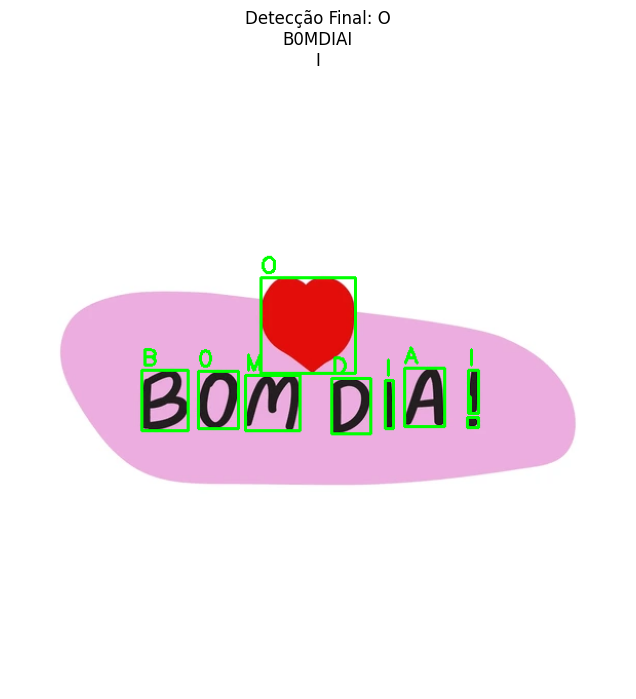


Resultado Final (Ordenado): t
B
Io
aE
araeI
I


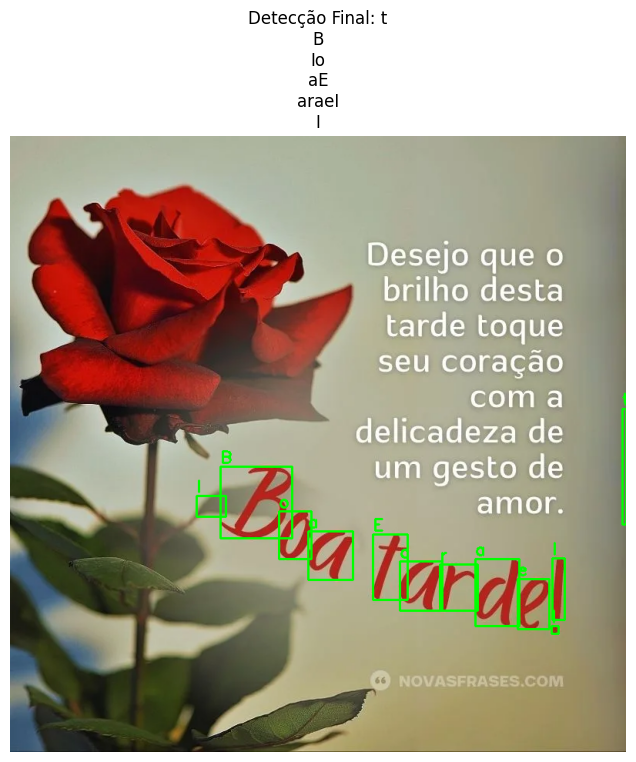


Resultado Final (Ordenado): V
J


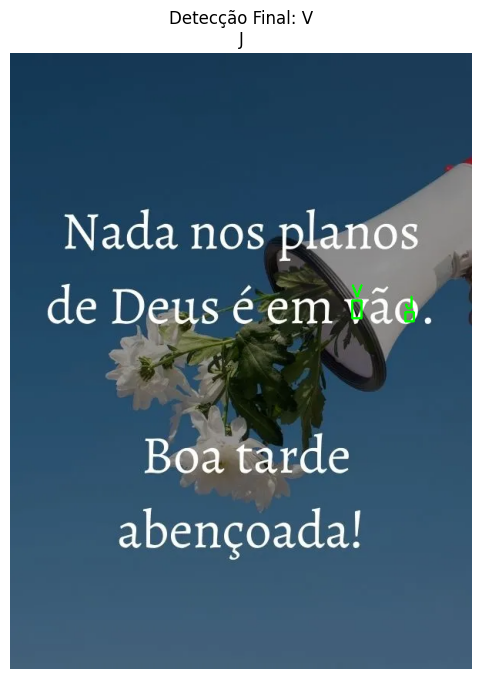


Resultado Final (Ordenado): MTM
w
nQwmnsmIa
iIPR
AIKSNQ
IiSNMsm
Xmm
AnnMo
2N
ItAE
SIFqwcKeqwa
Xf
NswwQsW
NII
SIAsmI
vI
SRMt
ILN
E
VI


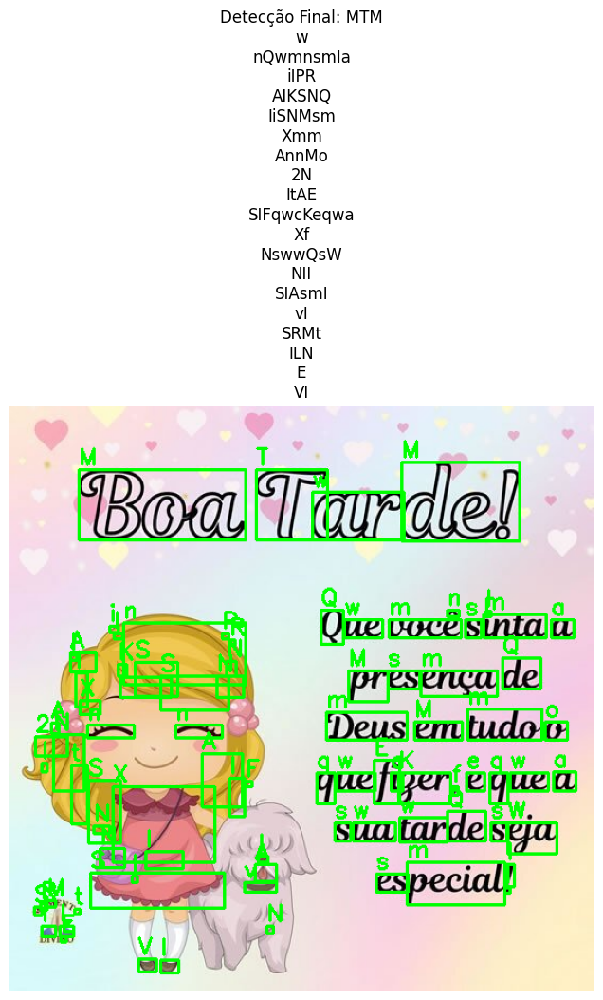


Resultado Final (Ordenado): Y7
x
r
II
Q6
sJ
neOOem
l
t
eacance
c
D
Imm
I
iIIIIIIAIS
CIII
IiIIB
INIyI
OaII
iIaL
al
Im
r
e
o
IIIIIIII
NIA


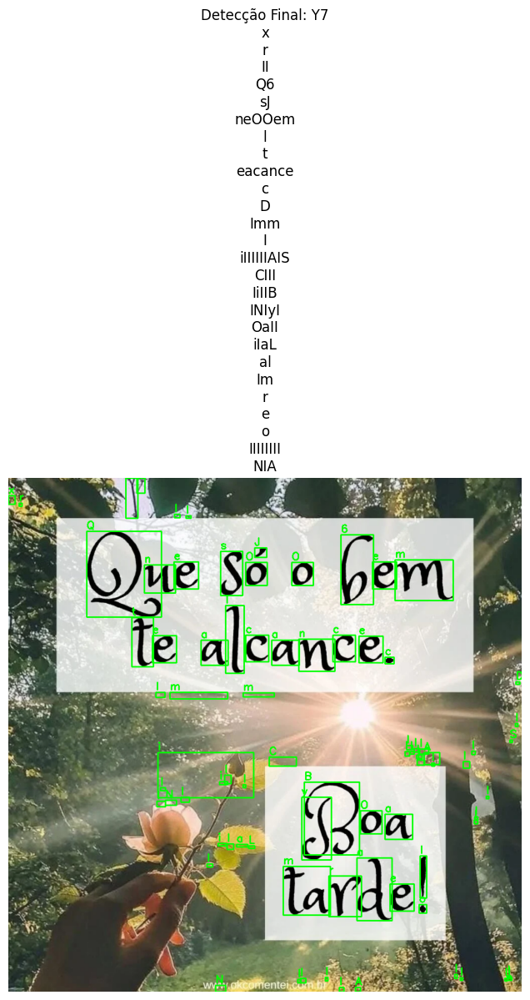


Resultado Final (Ordenado): L
I
H
I
II
a
uiH
H
diE
iimnm
m
i


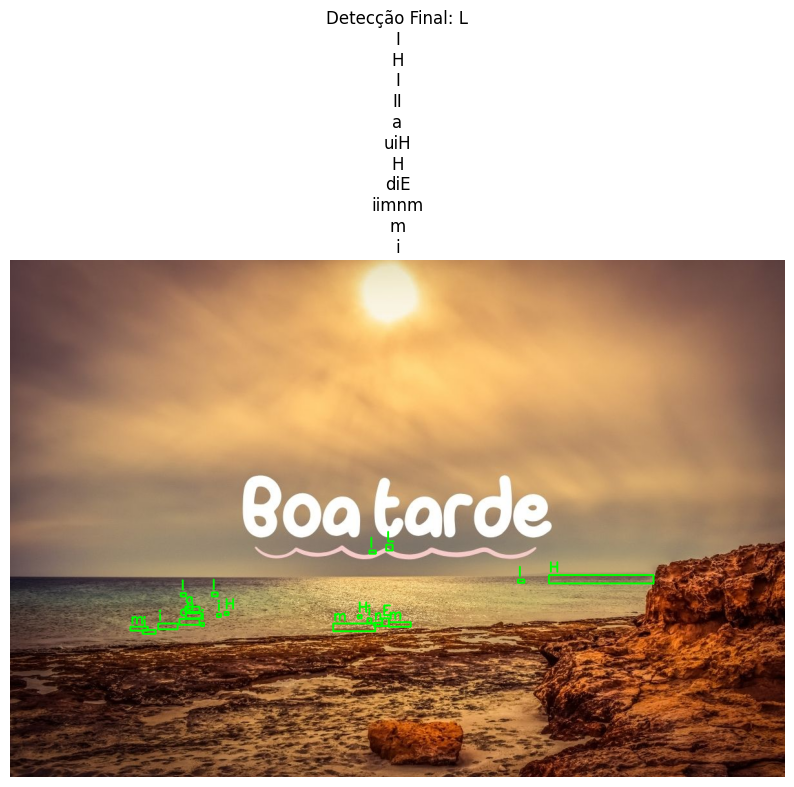


Resultado Final (Ordenado): UOBMI
MI
I
I
INI
MII
I
I
II
IIiI
i
IiIg
I
I
N
I
IA
iI
IIIZiIIiIIIII
IIIII
Si
II
I
III
I
II
III
I
III
n
IIA
IX
NII
I
I
IF
iIIIt
iIiIS
iIiiiiiI
IIIIIIiIiLIIN
Nim
IIIIm
Ii
I
IIILI
IIIII
I
II
I
OI
I
I
IIN
IIIII
II
II
I
II
II
Ii
uIINH
N
NsIINI
IImI
AIN
iII
IRII
BTdII
rI
IOaaYre
AIi
INII
IIIIIIIO
IIIIA
iIIIiI
IINI
nIIII
I


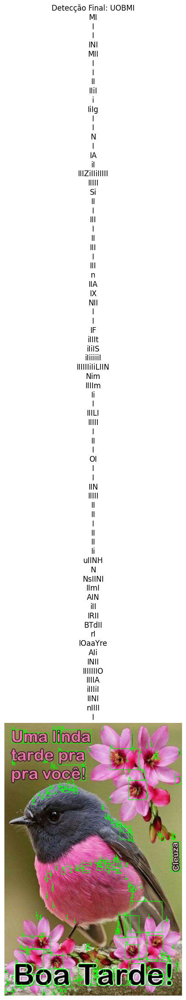


Resultado Final (Ordenado): ANQ
Rs
SF
I
I
IE5EIqHEIECMdE
LhEJHEFfWIHNNdNEIU
MICINGNIIRGI
m
ImM
T
IIII
IAIAA
II
R


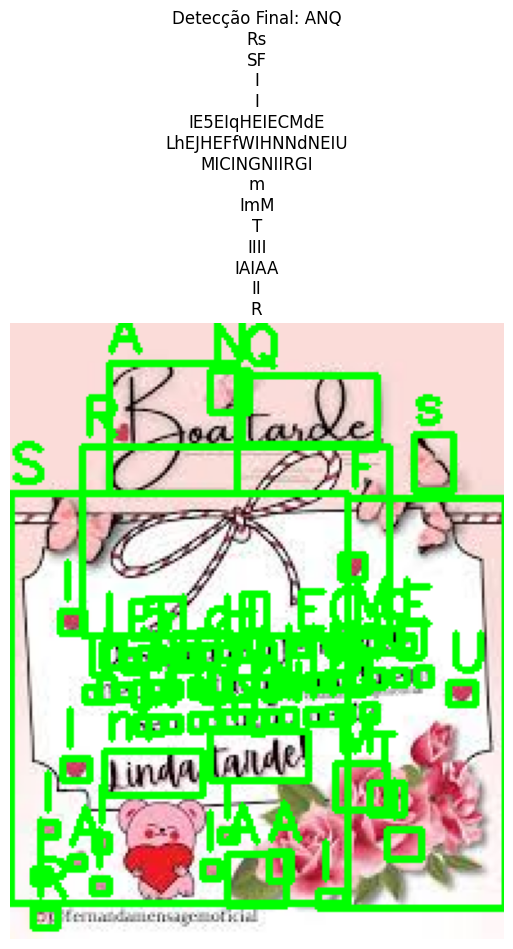


Resultado Final (Ordenado): I
III
I
O
i
YzrzYr
Mm
F
eTRADE
yCLDF
y
o
o
I
O


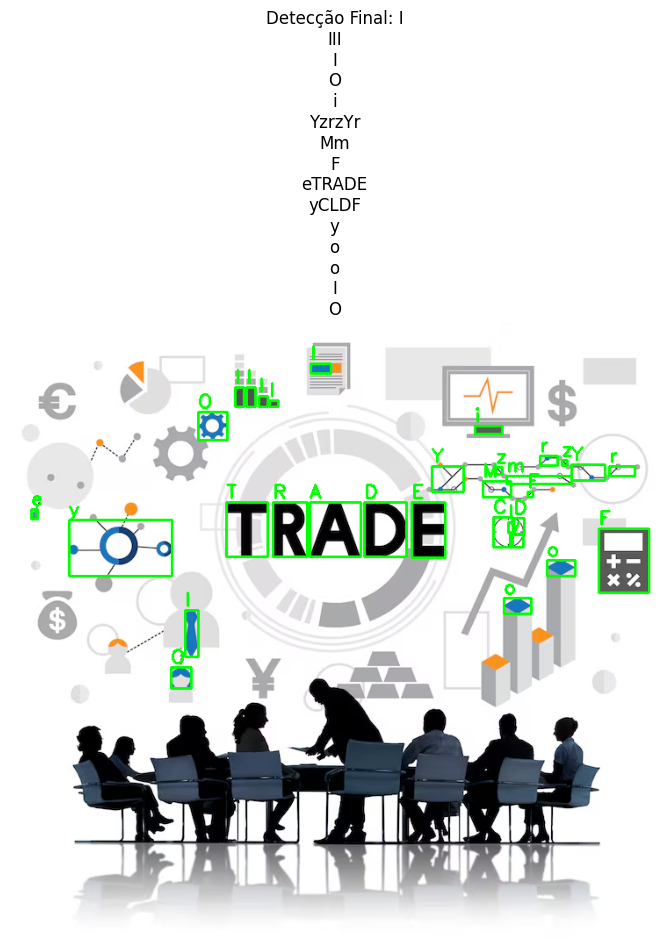


Resultado Final (Ordenado): o
TRADE


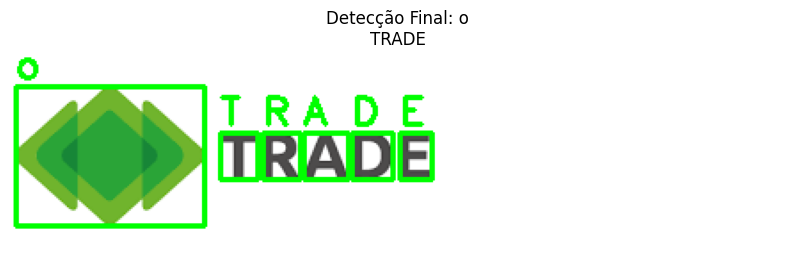


Resultado Final (Ordenado): IISA
AI
I


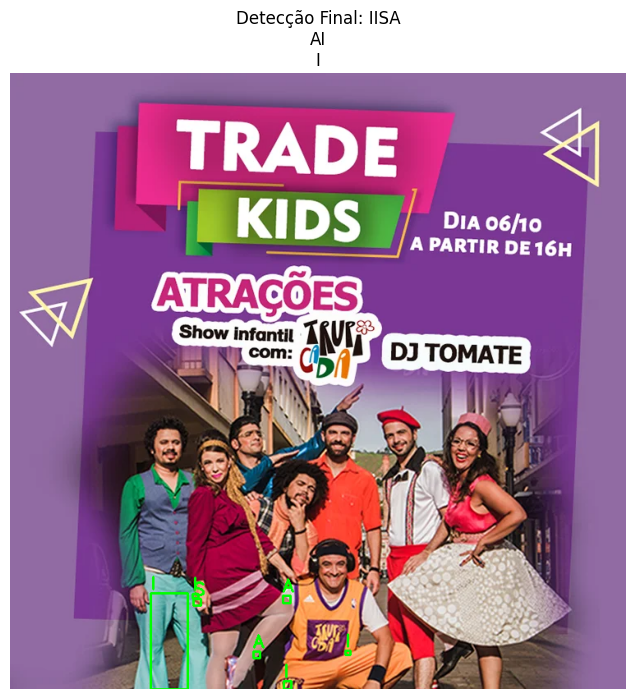


Resultado Final (Ordenado): L
EE
IL
I
T
I


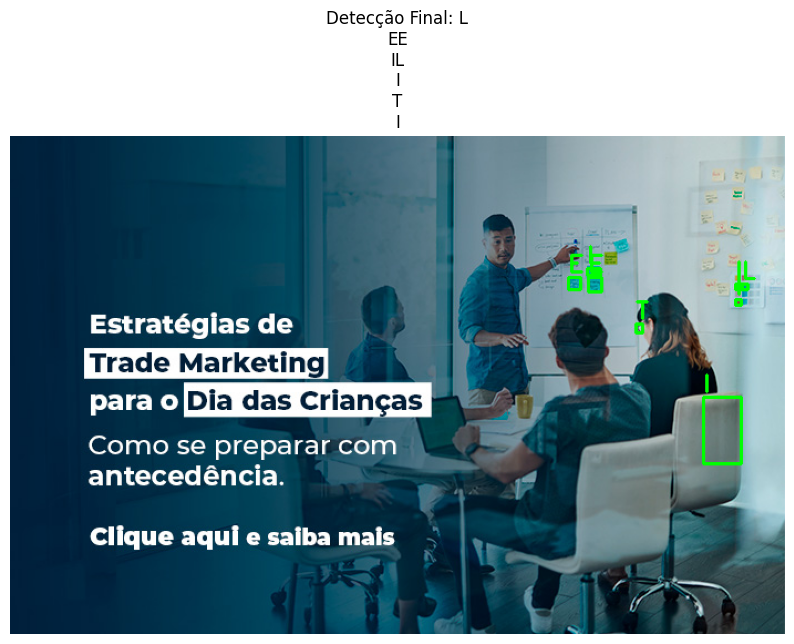

Programa finalizado. Até logo!


In [8]:
import cv2
import tensorflow as tf
import numpy as np
import os
import matplotlib.pyplot as plt
from script_carregar_dados import create_generators, IMAGE_SIZE

# --- 1. CONFIGURAÇÕES E CARREGAMENTO ---
MODEL_NAME = 'char_recognition_cnn.keras'
DATASET_PATH = 'chars74k_dataset_final'

# 1.1. Carregar o Modelo e Gerar Mapeamento de Classes
try:
    model = tf.keras.models.load_model(MODEL_NAME)
    # Criar um generator temporário SÓ para obter o mapeamento de classe
    temp_gen, _, _ = create_generators(DATASET_PATH) 
    class_indices = temp_gen.class_indices
    # Inverte o mapeamento: {indice: 'rotulo'}
    class_labels = {v: k for k, v in class_indices.items()}
    print(f"✅ Modelo e mapeamento de classes carregados com sucesso. Total de classes: {len(class_labels)}")
except Exception as e:
    print(f"❌ Erro na inicialização. Certifique-se de ter '{MODEL_NAME}' e 'data_loader.py'. Erro: {e}")
    exit()


def classify_image_and_segment(image_path):
    """
    Simula o fluxo de OCR: Segmenta caracteres usando OpenCV e classifica com a CNN.
    """
    
    if not os.path.exists(image_path):
        print(f"Erro: O arquivo não foi encontrado no caminho: {image_path}")
        return

    # 1. Carregar e Pré-processar a Imagem
    # Ler em escala de cinza
    img_color = cv2.imread(image_path)
    if img_color is None:
        print("Erro: Não foi possível carregar a imagem. Verifique o caminho e o formato.")
        return
        
    img_gray = cv2.cvtColor(img_color, cv2.COLOR_BGR2GRAY)
    
    # 2. Limiarização (Isolar os Caracteres)
    # THRESH_BINARY_INV: Inverte a imagem (Fundo preto, Caractere branco)
    _, binary_img = cv2.threshold(img_gray, 0, 255, cv2.THRESH_BINARY_INV + cv2.THRESH_OTSU)
    
    # 3. Detecção de Contornos (Segmentação)
    contours, _ = cv2.findContours(binary_img, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    
    # Lista para armazenar o caractere e sua posição X
    detected_chars = []
    
    # 4. Iteração e Classificação
    for contorno in contours:
        x, y, w, h = cv2.boundingRect(contorno)
        
        # Filtragem heurística simples (Ajuste esses valores para seu caso de uso)
        aspect_ratio = w / h
        if w < 5 or h < 5 or w > 200 or h > 200 or 0.3 > aspect_ratio > 3.0: 
            continue # Ignora ruídos ou objetos muito grandes/estreitos

        # --- A. Preparar o Caractere para a CNN ---
        
        # 4.1. Recortar, Redimensionar e Normalizar
        char_crop = img_gray[y:y+h, x:x+w]
        
        # Adiciona padding para evitar distorção ao redimensionar
        max_dim = max(w, h)
        padding_x = (max_dim - w) // 2
        padding_y = (max_dim - h) // 2
        
        # Cria uma tela de fundo branca/cinza para centralizar o caractere
        padded_char = np.pad(char_crop, ((padding_y, padding_y), (padding_x, padding_x)), 'constant', constant_values=255)
        
        # Redimensiona para 64x64
        char_resized = cv2.resize(padded_char, IMAGE_SIZE, interpolation=cv2.INTER_AREA)
        
        # Normalização e formato tensor (1, 64, 64, 1)
        input_tensor = (char_resized / 255.0).astype(np.float32)
        input_tensor = np.expand_dims(input_tensor, axis=-1)
        input_tensor = np.expand_dims(input_tensor, axis=0)

        # 4.2. Classificação com o Modelo CNN
        prediction = model.predict(input_tensor, verbose=0)
        predicted_index = np.argmax(prediction)
        predicted_char = class_labels.get(predicted_index, "?")
        confidence = prediction[0][predicted_index]

        # Armazena o resultado e a posição X
        detected_chars.append({'char': predicted_char, 'x': x, 'confidence': confidence, 'bbox': (x, y, w, h)})
        
        # Desenha a caixa delimitadora na imagem original para visualização
        cv2.rectangle(img_color, (x, y), (x + w, y + h), (0, 255, 0), 2)
        cv2.putText(img_color, predicted_char, (x, y - 5), cv2.FONT_HERSHEY_SIMPLEX, 0.7, (0, 255, 0), 2)


    # 5. Ordenar e Reconstruir a String
    detected_chars.sort(key=lambda item: item['x'])
    final_string = "".join([item['char'] for item in detected_chars])

    # 5.1. Calcular a Altura Média dos Caracteres (para definir a tolerância)
    if not detected_chars:
        return "Nenhum caractere detectado."
        
    alturas = [item['bbox'][3] for item in detected_chars] # 'bbox'[3] é a altura (h)
    altura_media = np.mean(alturas)
    # Define a tolerância vertical (ex: 40% da altura média)
    TOLERANCIA_Y = altura_media * 0.4 
    
    # 5.2. Ordenar por Posição Y (Vertical - De Cima para Baixo)
    detected_chars.sort(key=lambda item: item['bbox'][1]) # 'bbox'[1] é a posição Y

    linhas = []
    current_line = []
    
    for char_data in detected_chars:
        char_y = char_data['bbox'][1]
        
        if not current_line:
            # Começa a primeira linha
            current_line.append(char_data)
        else:
            # Posição Y da linha atual (usamos a média dos Ys na linha)
            avg_y_current_line = np.mean([item['bbox'][1] for item in current_line])
            
            # Se a posição Y do novo caractere estiver dentro da tolerância, ele pertence à linha atual
            if abs(char_y - avg_y_current_line) < TOLERANCIA_Y:
                current_line.append(char_data)
            else:
                # O caractere pertence a uma nova linha.
                linhas.append(current_line)
                current_line = [char_data]
                
    # Adiciona a última linha
    if current_line:
        linhas.append(current_line)

    
    # 5.3. Ordenar Caracteres dentro de Cada Linha (Esquerda para Direita)
    final_string_parts = []
    for line in linhas:
        # Ordena cada linha individualmente pela posição X (horizontal)
        line.sort(key=lambda item: item['x'])
        
        # Constrói a string da linha
        line_string = "".join([item['char'] for item in line])
        final_string_parts.append(line_string)

    # Reconstroi a string final, separando as linhas por quebras de linha (opcional, mas útil)
    final_string = "\n".join(final_string_parts)

    # 6. Exibir Resultados
    print(f"\nResultado Final (Ordenado): {final_string}")
    
    plt.figure(figsize=(10, 8))
    plt.imshow(cv2.cvtColor(img_color, cv2.COLOR_BGR2RGB))
    plt.title(f"Detecção Final: {final_string}")
    plt.axis('off')
    plt.show()


# --- EXECUÇÃO ---

if __name__ == '__main__':
    print("\n--- INÍCIO DO TESTADOR DE IMAGENS ---")
    print("Digite 'exit' para finalizar o programa.")
    
    while True:
        caminho_da_imagem = input("\nInforme o caminho completo da imagem (jpg, png, etc.): ").strip()
        
        if caminho_da_imagem.lower() == 'exit':
            print("Programa finalizado. Até logo!")
            break
        
        if caminho_da_imagem:
            classify_image_and_segment(caminho_da_imagem)